# Telecom Churn Case Study Assignment
## Steps to be implemented for building model
### Data PreProcessing
- Importing the data
- Checking the data before performing the action
- Checking Unique values and missing data
- Deleting the not relevent columns with missing data
- Deleting rows of some columns
- Outlier Identification
- Using K-cap to cap the Outlier so that we dont miss the data and preserve the important info
### EDA
- Univariate Analysis
- Bivariate Analysis
- Multivariate Analysis
### Train Test Split
### Scaling the data
### Model building
#### Without PCA
- Random Forest with k-fold and Prediction
- XGboost with k-fold and Prediction
#### With PCA
- Random Forest with k-fold and Prediction
## Results and Observation
## Strategies Recommonded

In [61]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
### For installing missingno library, type this command in terminal
#!pip install missingno

import missingno as msno
import statsmodels.api as sm
#Sklearn
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV,KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, precision_score, recall_score,accuracy_score
from sklearn.metrics import roc_curve
#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

#Others
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Data Loading

In [2]:
#Reading the train data
train_data = pd.read_csv("train.csv")
print(train_data.shape)

(69999, 172)


In [3]:
train_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [4]:
train_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

# Data Preprocessing

<Axes: >

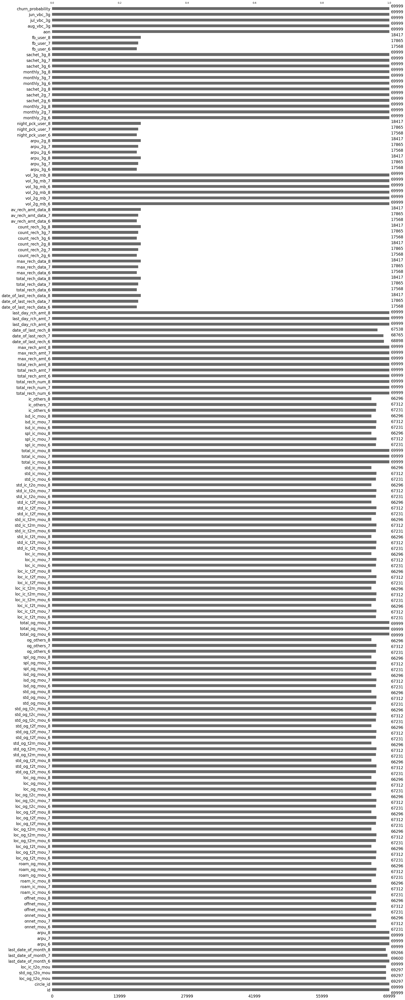

In [5]:
msno.bar(train_data)

In [6]:
# checking data unique value
train_data.nunique()

id                          69999
circle_id                       1
loc_og_t2o_mou                  1
std_og_t2o_mou                  1
loc_ic_t2o_mou                  1
last_date_of_month_6            1
last_date_of_month_7            1
last_date_of_month_8            1
arpu_6                      61615
arpu_7                      61425
arpu_8                      60194
onnet_mou_6                 20057
onnet_mou_7                 20076
onnet_mou_8                 19725
offnet_mou_6                26254
offnet_mou_7                26139
offnet_mou_8                25995
roam_ic_mou_6                5306
roam_ic_mou_7                4240
roam_ic_mou_8                4252
roam_og_mou_6                6568
roam_og_mou_7                5305
roam_og_mou_8                5215
loc_og_t2t_mou_6            11491
loc_og_t2t_mou_7            11359
loc_og_t2t_mou_8            11296
loc_og_t2m_mou_6            17848
loc_og_t2m_mou_7            17641
loc_og_t2m_mou_8            17616
loc_og_t2f_mou

In [7]:
train_data_with_unique= train_data.columns[train_data.nunique()==1]

###### Note:- We are dropping columns with only 1 value as these columns have no variance and no descriminative information 

In [8]:
new_train_data= train_data.drop(columns=train_data_with_unique)

In [9]:
# Checking the missing values in data
perc_missing_data=new_train_data.isnull().mean()*100
perc_missing_data.sort_values(ascending=False)

arpu_3g_6                   74.902499
night_pck_user_6            74.902499
total_rech_data_6           74.902499
max_rech_data_6             74.902499
date_of_last_rech_data_6    74.902499
count_rech_2g_6             74.902499
av_rech_amt_data_6          74.902499
fb_user_6                   74.902499
count_rech_3g_6             74.902499
arpu_2g_6                   74.902499
total_rech_data_7           74.478207
fb_user_7                   74.478207
count_rech_2g_7             74.478207
max_rech_data_7             74.478207
count_rech_3g_7             74.478207
av_rech_amt_data_7          74.478207
arpu_2g_7                   74.478207
night_pck_user_7            74.478207
date_of_last_rech_data_7    74.478207
arpu_3g_7                   74.478207
total_rech_data_8           73.689624
arpu_2g_8                   73.689624
max_rech_data_8             73.689624
count_rech_2g_8             73.689624
count_rech_3g_8             73.689624
av_rech_amt_data_8          73.689624
night_pck_us

##### We can see above that few columns have more than 70% data missing so we are removing those columns 

In [10]:
columns_to_drop = perc_missing_data[perc_missing_data>70].index
columns_to_drop

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
       'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7',
       'fb_user_8'],
      dtype='object')

In [11]:
train_data_cleaned=new_train_data.drop(columns=columns_to_drop)
train_data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 129 entries, id to churn_probability
dtypes: float64(99), int64(27), object(3)
memory usage: 68.9+ MB


In [12]:
train_data_cleaned.isnull().sum().sort_values(ascending=False)

std_og_t2f_mou_8       3703
loc_og_mou_8           3703
loc_og_t2c_mou_8       3703
loc_ic_t2m_mou_8       3703
og_others_8            3703
loc_og_t2f_mou_8       3703
loc_ic_t2f_mou_8       3703
loc_ic_mou_8           3703
loc_og_t2m_mou_8       3703
std_og_mou_8           3703
std_ic_t2t_mou_8       3703
loc_og_t2t_mou_8       3703
std_og_t2t_mou_8       3703
std_ic_t2m_mou_8       3703
roam_og_mou_8          3703
std_ic_t2f_mou_8       3703
roam_ic_mou_8          3703
spl_og_mou_8           3703
std_ic_mou_8           3703
offnet_mou_8           3703
std_og_t2m_mou_8       3703
spl_ic_mou_8           3703
onnet_mou_8            3703
isd_og_mou_8           3703
isd_ic_mou_8           3703
ic_others_8            3703
loc_ic_t2t_mou_8       3703
og_others_6            2768
isd_og_mou_6           2768
loc_ic_t2t_mou_6       2768
loc_ic_mou_6           2768
loc_ic_t2m_mou_6       2768
loc_ic_t2f_mou_6       2768
std_ic_t2m_mou_6       2768
std_ic_t2f_mou_6       2768
std_ic_mou_6        

##### Since date column have less missing values so we are imputing them with mode

In [13]:
date = [i for i in list(train_data_cleaned) if re.search('date',i)]
for column in date:
    mode_value = train_data_cleaned[column].mode()[0]  
    train_data_cleaned[column] = train_data_cleaned[column].fillna(mode_value)

In [14]:
columns_with_missing_value=train_data_cleaned.columns[train_data_cleaned.isnull().any()]
for column in columns_with_missing_value:
    train_data_cleaned[column].fillna(train_data_cleaned[column].mean(),inplace=True)

In [15]:
train_data_cleaned.isnull().sum().sort_values(ascending=False)

id                     0
loc_ic_mou_7           0
total_rech_amt_7       0
total_rech_amt_6       0
total_rech_num_8       0
total_rech_num_7       0
total_rech_num_6       0
ic_others_8            0
ic_others_7            0
ic_others_6            0
isd_ic_mou_8           0
isd_ic_mou_7           0
isd_ic_mou_6           0
spl_ic_mou_8           0
spl_ic_mou_7           0
spl_ic_mou_6           0
total_ic_mou_8         0
total_ic_mou_7         0
total_ic_mou_6         0
std_ic_mou_8           0
std_ic_mou_7           0
std_ic_mou_6           0
std_ic_t2f_mou_8       0
std_ic_t2f_mou_7       0
std_ic_t2f_mou_6       0
std_ic_t2m_mou_8       0
std_ic_t2m_mou_7       0
std_ic_t2m_mou_6       0
std_ic_t2t_mou_8       0
std_ic_t2t_mou_7       0
std_ic_t2t_mou_6       0
total_rech_amt_8       0
max_rech_amt_6         0
max_rech_amt_7         0
monthly_2g_8           0
jun_vbc_3g             0
jul_vbc_3g             0
aug_vbc_3g             0
aon                    0
sachet_3g_8            0


In [17]:
train_data_cleaned.isnull().sum().sort_values(ascending=False)

id                     0
loc_ic_mou_7           0
total_rech_amt_7       0
total_rech_amt_6       0
total_rech_num_8       0
total_rech_num_7       0
total_rech_num_6       0
ic_others_8            0
ic_others_7            0
ic_others_6            0
isd_ic_mou_8           0
isd_ic_mou_7           0
isd_ic_mou_6           0
spl_ic_mou_8           0
spl_ic_mou_7           0
spl_ic_mou_6           0
total_ic_mou_8         0
total_ic_mou_7         0
total_ic_mou_6         0
std_ic_mou_8           0
std_ic_mou_7           0
std_ic_mou_6           0
std_ic_t2f_mou_8       0
std_ic_t2f_mou_7       0
std_ic_t2f_mou_6       0
std_ic_t2m_mou_8       0
std_ic_t2m_mou_7       0
std_ic_t2m_mou_6       0
std_ic_t2t_mou_8       0
std_ic_t2t_mou_7       0
std_ic_t2t_mou_6       0
total_rech_amt_8       0
max_rech_amt_6         0
max_rech_amt_7         0
monthly_2g_8           0
jun_vbc_3g             0
jul_vbc_3g             0
aug_vbc_3g             0
aon                    0
sachet_3g_8            0


In [18]:
train_data_cleaned.shape

(69999, 129)

##### Now there are 3 date columns we are going to extract day from those columns as new columns

In [19]:
for x in date:
    train_data_cleaned[x]=pd.to_datetime(train_data_cleaned[x], format='%m/%d/%Y')

In [20]:
train_data_cleaned["Last_Recharge_day_June"]=train_data_cleaned['date_of_last_rech_6'].dt.day
train_data_cleaned["Last_Recharge_day_July"]=train_data_cleaned['date_of_last_rech_7'].dt.day
train_data_cleaned["Last_Recharge_day_August"]=train_data_cleaned['date_of_last_rech_8'].dt.day

##### We are dropping the original date column and id column

In [21]:
new_train_data_cleaned=train_data_cleaned.drop(["date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","id"],axis=1)

In [22]:
new_train_data_cleaned.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,Last_Recharge_day_June,Last_Recharge_day_July,Last_Recharge_day_August
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,22,10,24
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0.0,352.91,0.00,0.0,3.96,0.0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,12,10,26
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,11,22,24
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,8.89,0.28,2.8

In [23]:
new_train_data_cleaned.shape

(69999, 128)

In [24]:
X_train_data_cleaned=new_train_data_cleaned.drop(columns=['churn_probability'])
y=new_train_data_cleaned['churn_probability']

#### Making box plot for outlier Identification

In [25]:
nums_col=X_train_data_cleaned.select_dtypes(include=['int64','float64','int32']).columns.tolist()

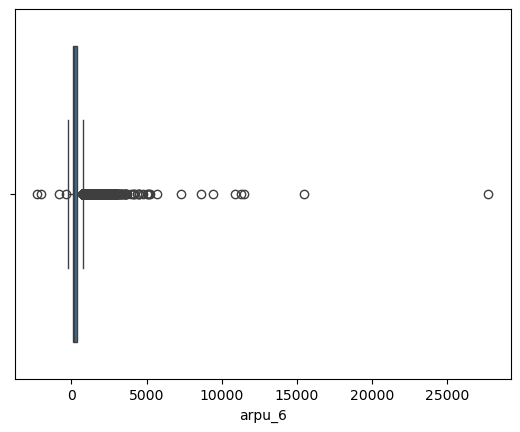

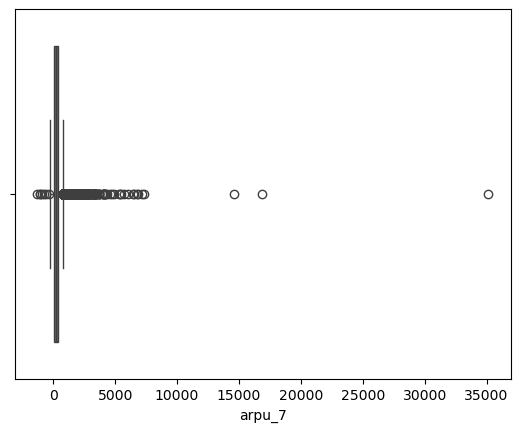

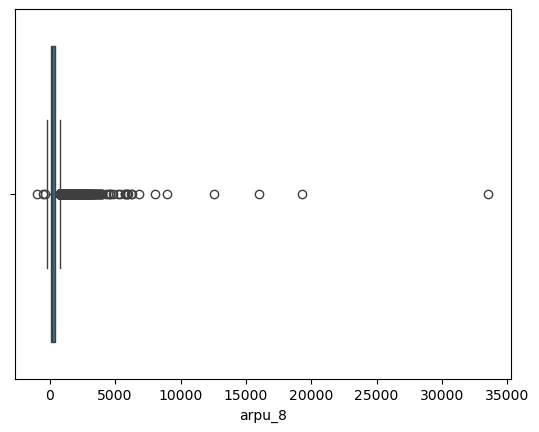

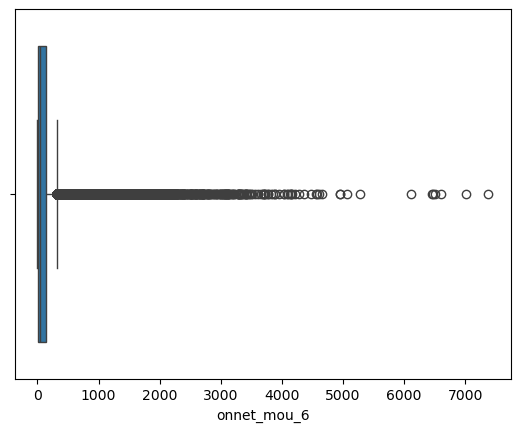

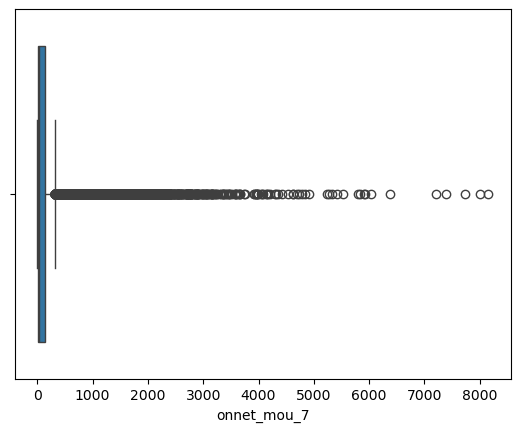

...

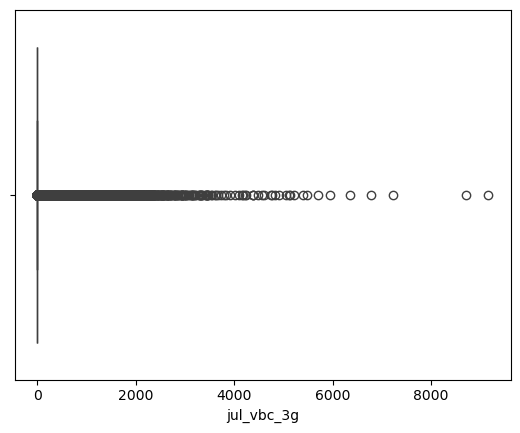

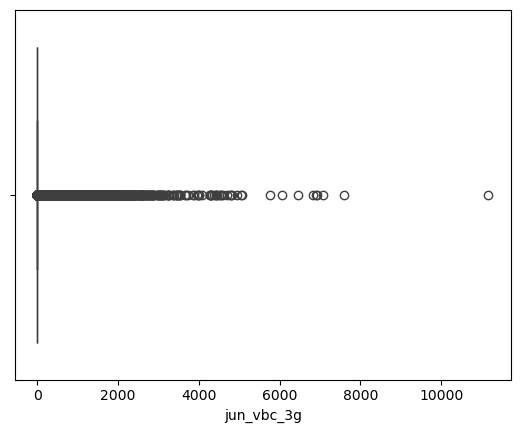

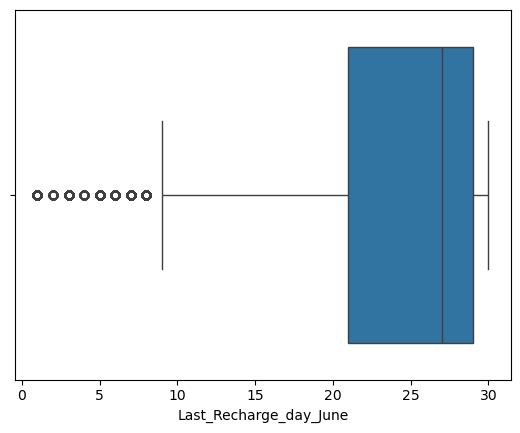

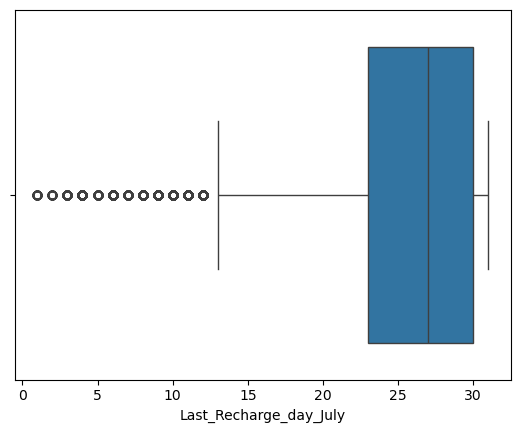

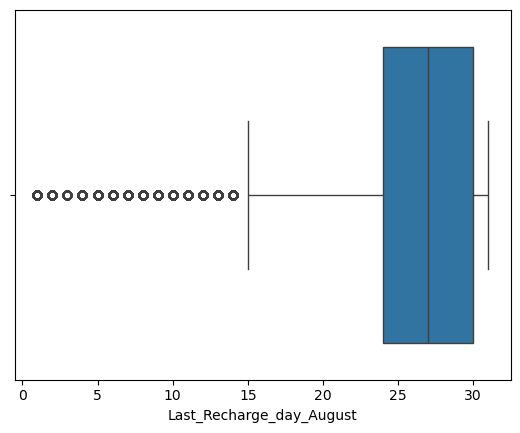

In [26]:
for i in nums_col:
    sns.boxplot(x=X_train_data_cleaned[i])
    plt.show()

##### Since we have outliers in many columns removing outlier will result in loss of data so we are using K- Sigma method to cap all the outliers.

In [27]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

<Axes: >

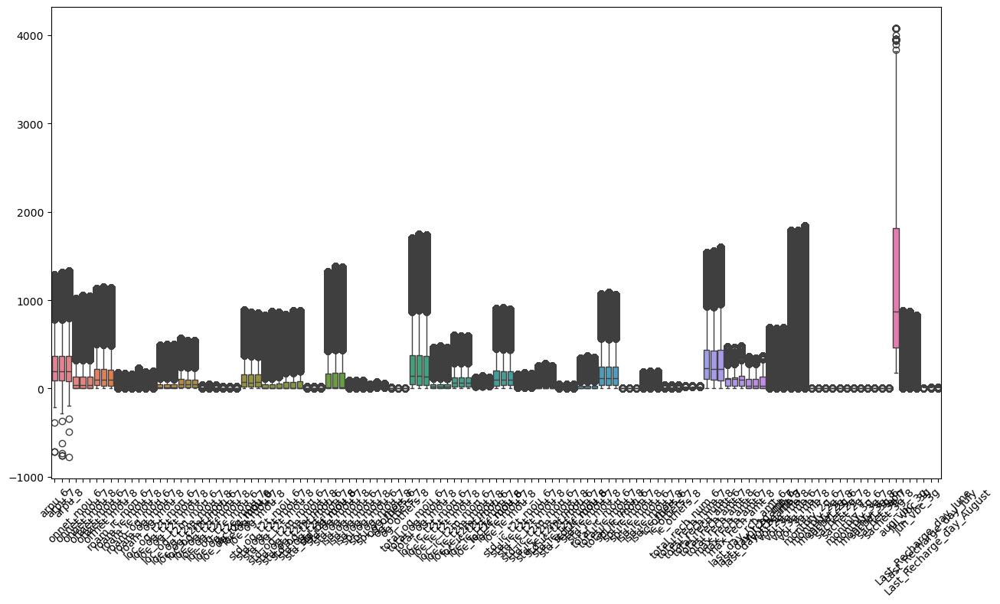

In [28]:
train_data_outlier = X_train_data_cleaned.apply(cap_outliers, axis=0)

plt.figure(figsize=(15,8))
plt.xticks(rotation=45)
sns.boxplot(data = train_data_outlier)

## EDA 

### Univariate Analysis

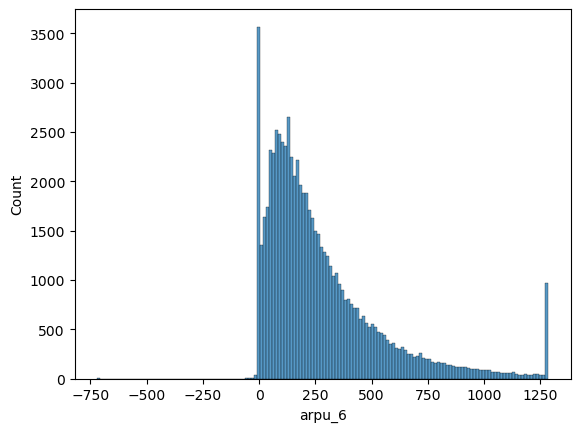

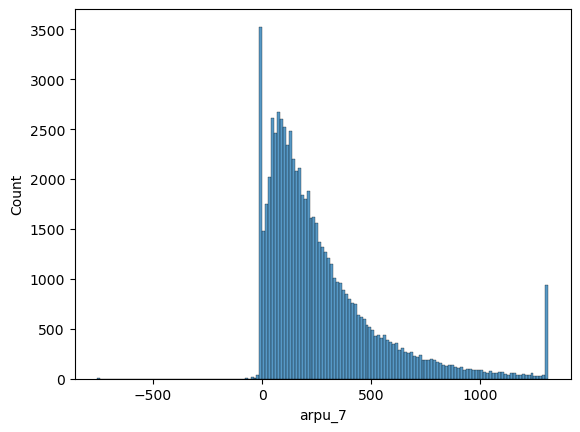

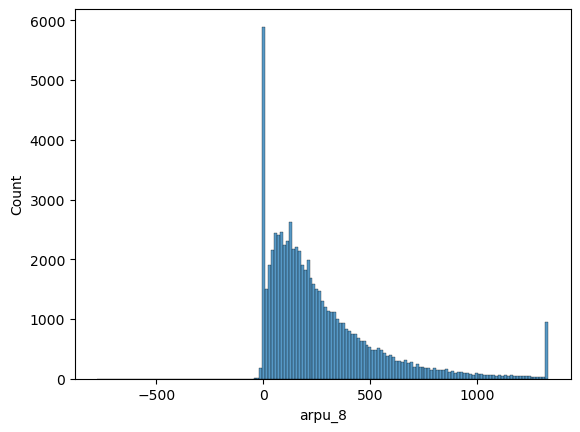

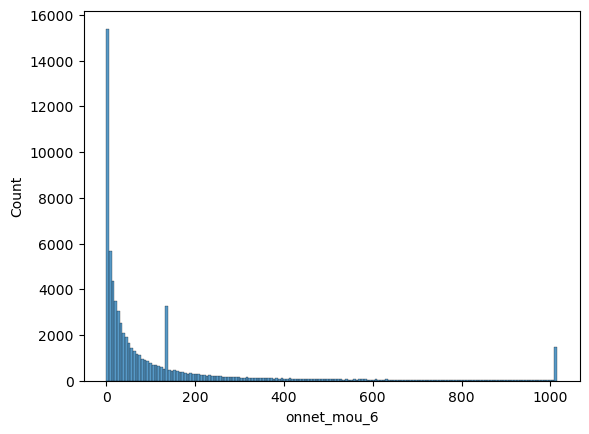

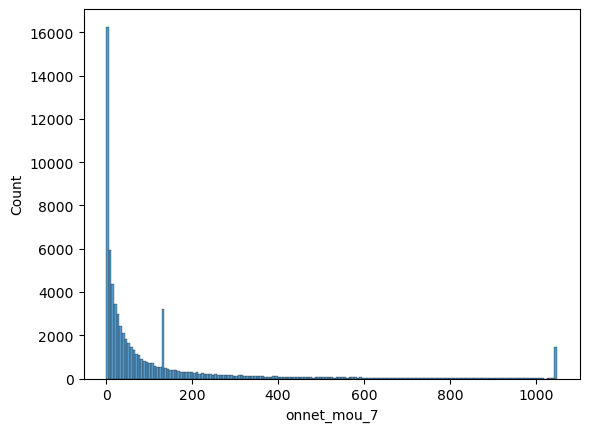

...

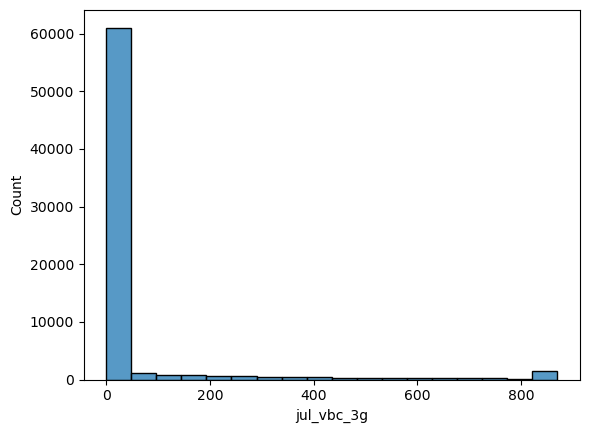

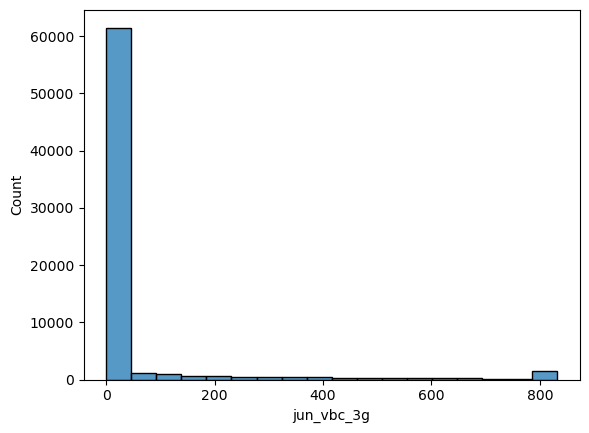

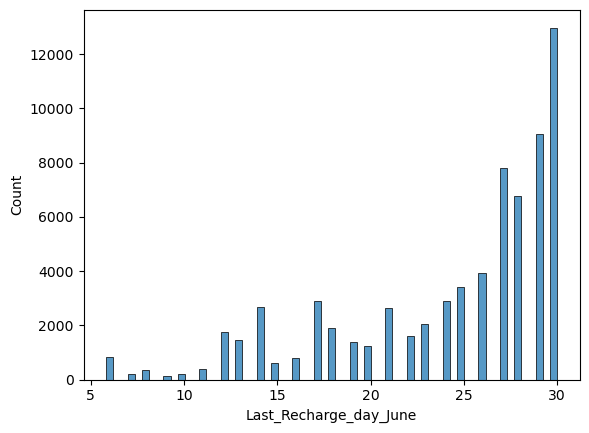

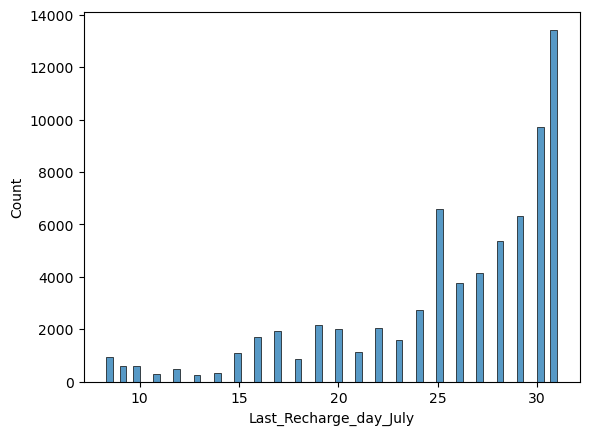

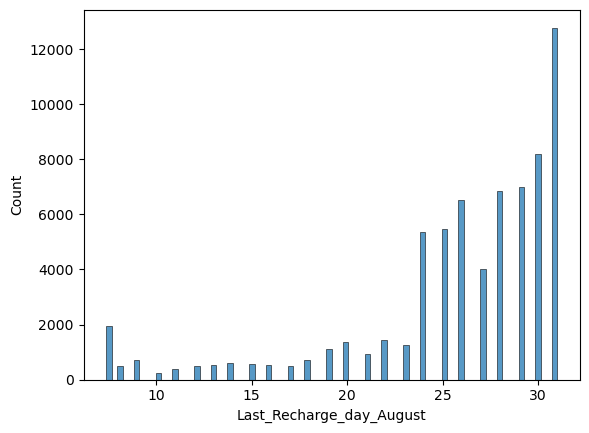

In [29]:
for i in nums_col:
    sns.histplot(x=train_data_outlier[i])
    plt.show()

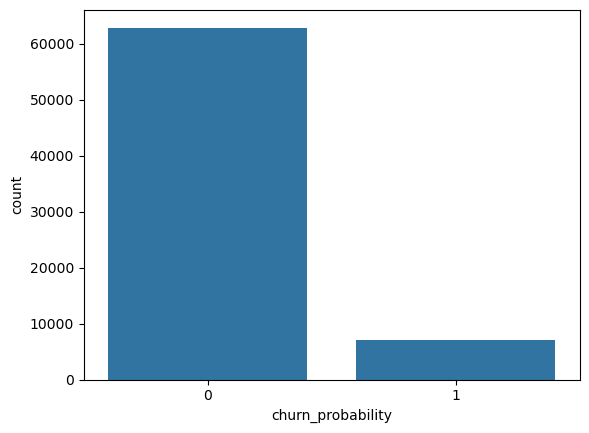

In [30]:
sns.countplot(x=y)
plt.show()

#### Observations in Univariate Analysis:-
- Mostly columns are left skewed
- Columns"Last_Recharge_day_June, Last_Recharge_day_July, Last_Recharge_day_August" shows that most recharge are done at month end.
- Mostly customers are not churned

### Bivariate Analysis

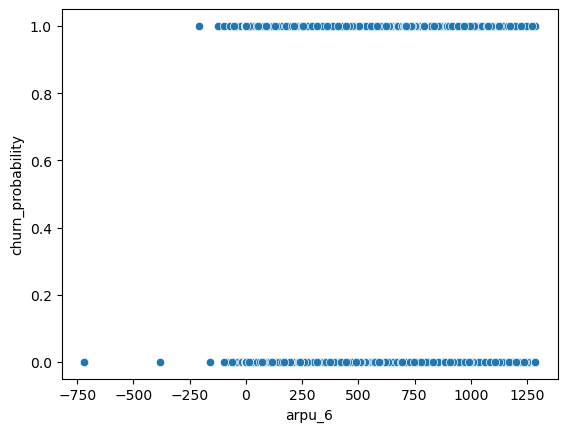

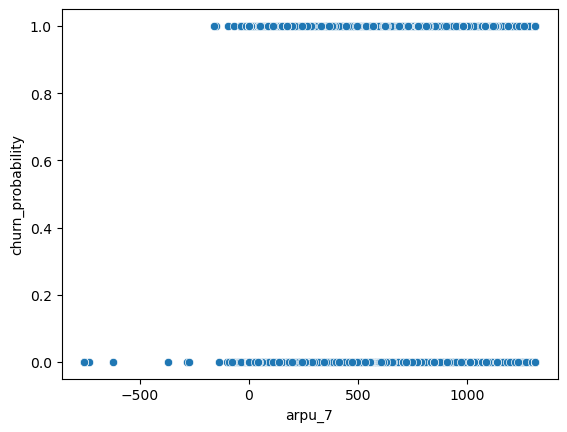

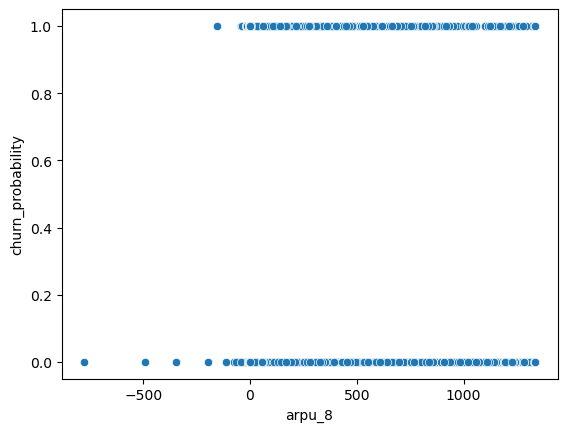

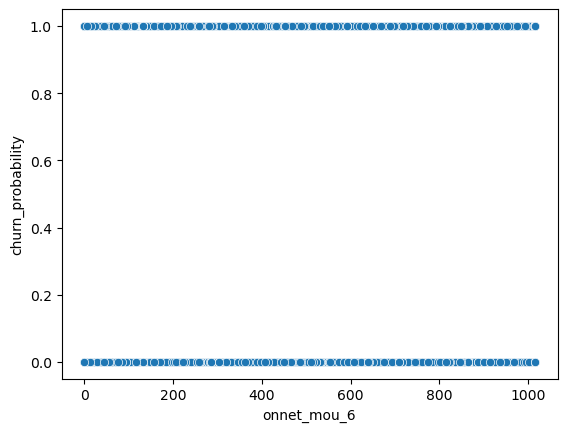

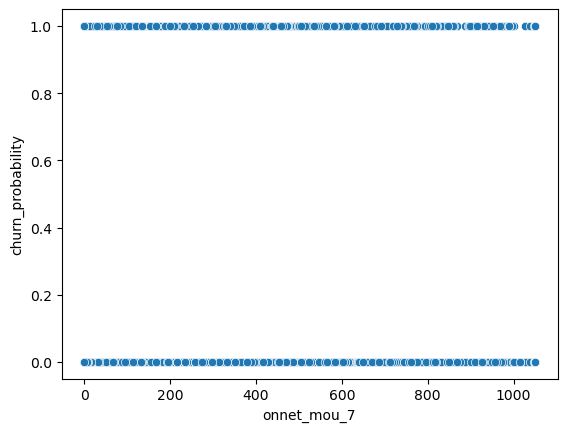

...

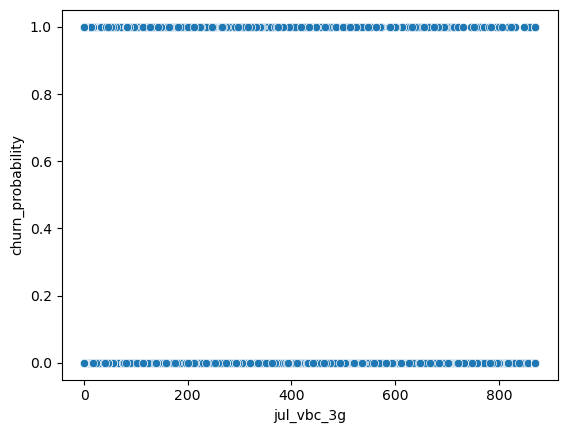

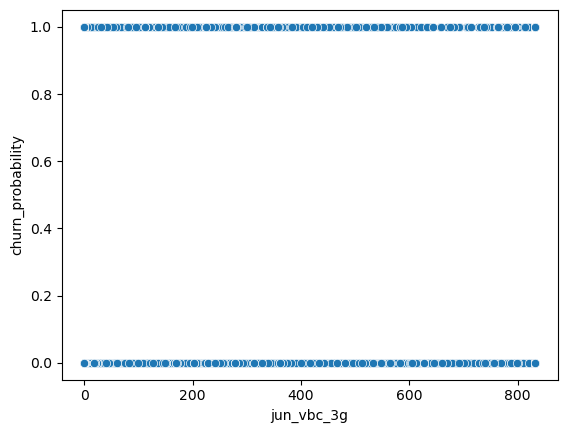

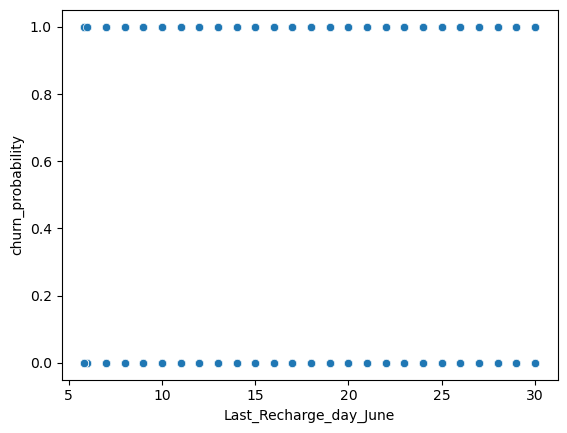

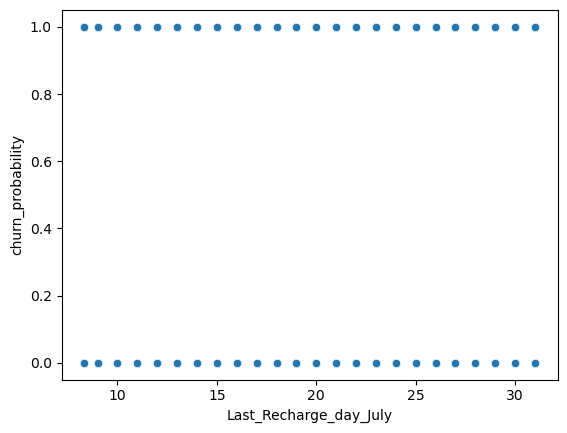

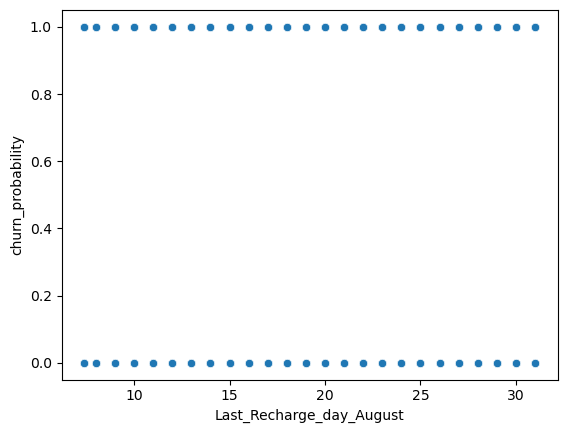

In [31]:
for i in nums_col:
    sns.scatterplot(x=train_data_outlier[i],y=y)
    plt.show()

### Multivariate analysis

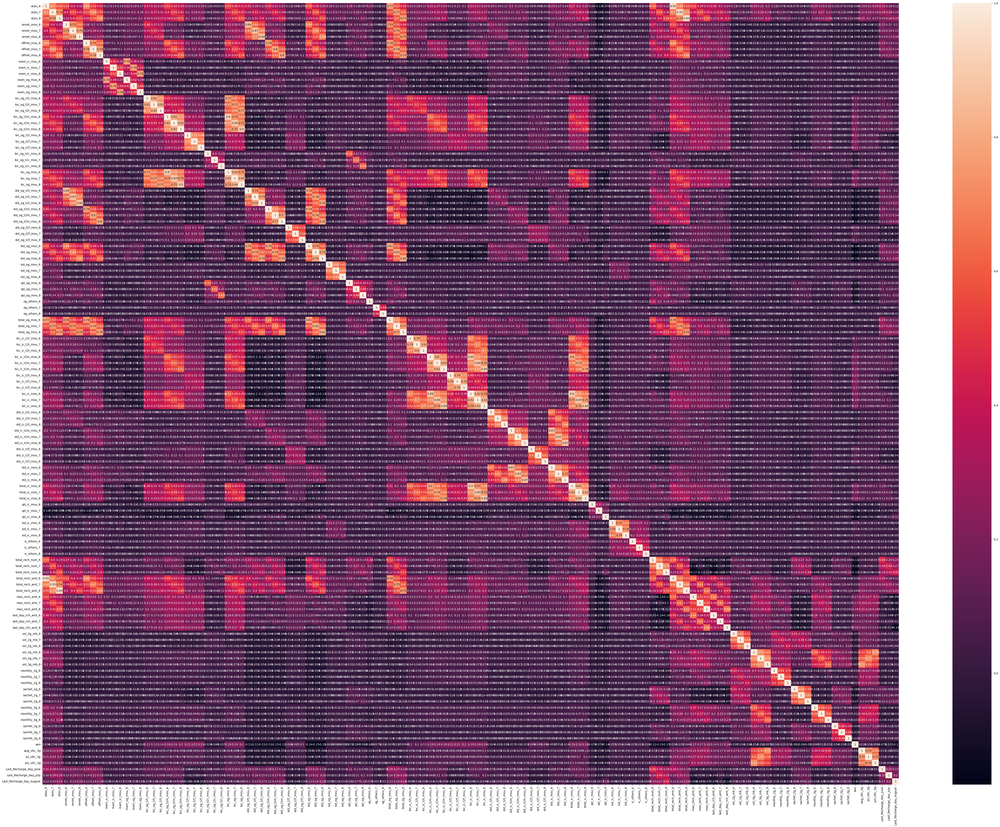

In [32]:
plt.figure(figsize=(68,50))
sns.heatmap(train_data_outlier[nums_col].corr(),annot=True)
plt.show()

##### Since we have lot of columns correlation map is hard to read and interpret from it

In [33]:
print(train_data_outlier.shape)
print(y.shape)

(69999, 127)
(69999,)


### Train-Test Split

In [34]:
X_train,X_test,y_train,y_test=train_test_split(train_data_outlier,y,test_size=0.2,random_state=100)

### Scaling the data

In [35]:
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [36]:
X_train_scaled_df=pd.DataFrame(X_train_scaled,columns=train_data_outlier.columns)
X_test_scaled_df=pd.DataFrame(X_test_scaled,columns=train_data_outlier.columns)

## Model Building

### Random Forest with Hyper Parameter and without PCA

In [38]:
param_grid_randomforest={
    'max_depth':[5,10,20,50],
    'min_samples_leaf': [ 5,10,15,30],
    'min_samples_split': [10, 15,20,30],
    'n_estimators': [300,500,700,1000]
    
}

In [101]:
stratified_kf = StratifiedKFold(n_splits=4, shuffle=True, random_state=100) ##previously n_split was 3 trying 4 with xgboost

In [40]:
random_forest_gridcv=RandomForestClassifier()

In [41]:
random_forest_grid_search=GridSearchCV(estimator=random_forest_gridcv,param_grid=param_grid_randomforest,cv=stratified_kf,n_jobs=-1,scoring="accuracy")

In [42]:
random_forest_grid_search.fit(X_train_scaled_df,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=100, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 50],
                         'min_samples_leaf': [5, 10, 15, 30],
                         'min_samples_split': [10, 15, 20, 30],
                         'n_estimators': [300, 500, 700, 1000]},
             scoring='accuracy')

In [43]:
random_forest_grid_search.best_score_

0.9414811147402383

In [45]:
rf_best_estimator = random_forest_grid_search.best_estimator_
rf_best_estimator

RandomForestClassifier(max_depth=20, min_samples_leaf=5, min_samples_split=20,
                       n_estimators=500)

In [46]:
y_train_pred=rf_best_estimator.predict(X_train_scaled_df)
Y_test_pred=rf_best_estimator.predict(X_test_scaled_df)

In [47]:
print("Train accuracy: ",round(100*accuracy_score(y_train, y_train_pred),2),"%")
print("Test accuracy: ",round(100*accuracy_score(y_test, Y_test_pred),2),"%")

Train accuracy:  95.58 %
Test accuracy:  94.48 %


In [142]:
print("Train recall score: ",round(100*recall_score(y_train, y_train_pred),2),"%")

Train recall score:  64.48 %


In [143]:
print("Train precision score: ",round(100*precision_score(y_train, y_train_pred),2),"%")

Train precision score:  98.59 %


In [149]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": rf_best_estimator.feature_importances_
})
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
80,total_ic_mou_8,0.099654
53,total_og_mou_8,0.070335
2,arpu_8,0.056474
14,roam_og_mou_8,0.050778
50,og_others_8,0.048933
11,roam_ic_mou_8,0.045220
95,total_rech_amt_8,0.033286
98,max_rech_amt_8,0.033247
65,loc_ic_mou_8,0.033106
44,isd_og_mou_8,0.030869


### XGBoost with hyperparameter tuning and without PCA

In [62]:
xgb_model=XGBClassifier()

In [63]:
param_grid_xgb = {
    'n_estimators': [200,500,700,1000],
    'max_depth': [5,10,20,30,50],
    'learning_rate': [0.01,0.015,0.02,0.05, 0.1],
    'subsample': [0.5,0.6, 0.8, 1.0]  # Use GPU for prediction
}

In [64]:
xgboost_grid_search=GridSearchCV(estimator=xgb_model,param_grid=param_grid_xgb,cv=stratified_kf,scoring='accuracy',n_jobs=-1)

In [65]:
xgboost_grid_search.fit(X_train_scaled_df,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=100, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_ty...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.015, 0.02, 0.05, 0.1],
                         'max_depth': [5, 10, 20, 30, 50],
                         'n_estimators': [200, 500, 700, 1000],
                         'subsample': [0.5, 0.6, 0.8, 1.0]},
             scoring='accuracy')

In [66]:
best_params = xgboost_grid_search.best_params_
best_score = xgboost_grid_search.best_score_
print(f'Best Parameters: {best_params}, Best Score: {best_score}')

Best Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 0.5}, Best Score: 0.9429811558771338


In [67]:
model=xgboost_grid_search.best_estimator_

In [68]:
y_pred_train = model.predict(X_train_scaled_df)
y_pred_test = model.predict(X_test_scaled_df)
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f'Initial Model Train Accuracy: {train_accuracy}')
print(f'Initial Model Test Accuracy: {test_accuracy}')

Initial Model Train Accuracy: 0.9512669869104805
Initial Model Test Accuracy: 0.9461428571428572


In [141]:
print("Train recall score: ",round(100*recall_score(y_train, y_pred_train),2),"%")

Train recall score:  70.35 %


In [144]:
print("Train precision score: ",round(100*precision_score(y_train, y_pred_train),2),"%")

Train precision score:  79.72 %


In [153]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": model.feature_importances_
})
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
80,total_ic_mou_8,0.292053
14,roam_og_mou_8,0.027340
65,loc_ic_mou_8,0.019545
104,vol_2g_mb_8,0.017664
101,last_day_rch_amt_8,0.016117
11,roam_ic_mou_8,0.011301
83,spl_ic_mou_8,0.011037
40,std_og_mou_7,0.010781
53,total_og_mou_8,0.010644
107,vol_3g_mb_8,0.010607


## With PCA Model Building

In [73]:
pca=PCA(random_state=100)

In [74]:
pca.fit(X_train_scaled_df)

PCA(random_state=100)

In [75]:
pca.components_

array([[ 1.70315584e-01,  1.81673768e-01,  1.71882782e-01, ...,
         6.28527876e-02,  5.55621361e-02,  3.44484666e-02],
       [ 5.80211921e-02,  7.72814991e-02,  6.74842630e-02, ...,
         5.44714107e-02,  5.53202387e-02,  6.65279774e-02],
       [ 7.25864740e-02,  8.46099189e-02,  8.70821358e-02, ...,
        -2.06251870e-02, -1.75215795e-02, -1.40539668e-02],
       ...,
       [ 2.29780081e-03, -9.19376797e-03,  7.66398673e-03, ...,
         6.87241439e-05, -9.32539416e-05, -1.64590167e-06],
       [-1.02164298e-02,  3.54235041e-04,  6.86449536e-03, ...,
        -5.88620168e-05,  2.82742889e-04, -1.98255421e-04],
       [-1.05439299e-04, -3.96323043e-03,  9.71128048e-04, ...,
        -5.57331892e-04,  6.29546135e-04,  6.77231333e-04]])

In [76]:
pca.explained_variance_ratio_

array([1.53422268e-01, 8.69107544e-02, 5.39105964e-02, 4.62230580e-02,
       3.76994946e-02, 2.95717464e-02, 2.63874133e-02, 2.49304453e-02,
       2.44668254e-02, 2.31221991e-02, 2.11200532e-02, 2.06927288e-02,
       1.87605767e-02, 1.74150684e-02, 1.66084157e-02, 1.51455288e-02,
       1.36773125e-02, 1.26086910e-02, 1.20299329e-02, 1.16377991e-02,
       1.15139380e-02, 1.10809743e-02, 1.09004513e-02, 1.02134523e-02,
       9.29942598e-03, 9.27322981e-03, 8.89747117e-03, 8.55464789e-03,
       8.19998098e-03, 7.76431259e-03, 7.53556737e-03, 7.28059004e-03,
       7.09665290e-03, 6.90503710e-03, 6.80519230e-03, 6.40491256e-03,
       6.22830430e-03, 6.03717913e-03, 5.97034029e-03, 5.87821260e-03,
       5.78255070e-03, 5.47172354e-03, 5.28579837e-03, 5.12108578e-03,
       5.11031604e-03, 5.03686521e-03, 4.91537125e-03, 4.53077045e-03,
       4.52722546e-03, 4.47794210e-03, 4.32418232e-03, 4.30870314e-03,
       4.29098944e-03, 4.03906352e-03, 3.97937618e-03, 3.76338839e-03,
      

In [78]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

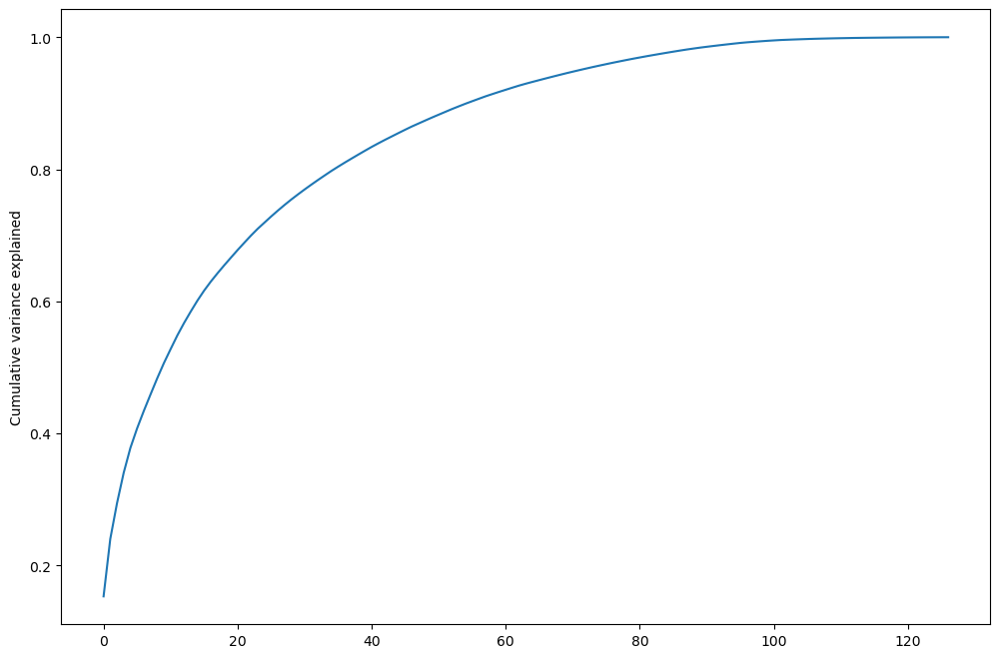

In [79]:
fig = plt.figure(figsize=[12,8])
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [80]:
pca_again=PCA(n_components=0.99,random_state=100)

In [102]:
X_train_pca=pca_again.fit_transform(X_train_scaled_df)
X_test_pca=pca_again.transform(X_test_scaled_df)

In [103]:
X_train_pca.shape

(55999, 95)

In [104]:
X_test_pca.shape

(14000, 95)

## Random Forest with PCA

In [84]:
random_forest_grid_search_PCA=GridSearchCV(estimator=random_forest_gridcv,param_grid=param_grid_randomforest,cv=stratified_kf,n_jobs=-1,scoring="accuracy")

In [85]:
random_forest_grid_search_PCA.fit(X_train_pca,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=100, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 50],
                         'min_samples_leaf': [5, 10, 15, 30],
                         'min_samples_split': [10, 15, 20, 30],
                         'n_estimators': [300, 500, 700, 1000]},
             scoring='accuracy')

In [86]:
random_forest_grid_search_PCA.best_score_

0.9199628573851847

In [90]:
rf_best_estimator_PCA = random_forest_grid_search_PCA.best_estimator_
rf_best_estimator_PCA

RandomForestClassifier(max_depth=50, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=500)

In [105]:
y_train_pred_PCA=rf_best_estimator_PCA.predict(X_train_pca)
Y_test_pred_PCA=rf_best_estimator_PCA.predict(X_test_pca)

In [106]:
print("Train accuracy: ",round(100*accuracy_score(y_train, y_train_pred_PCA),2),"%")
print("Test accuracy: ",round(100*accuracy_score(y_test, Y_test_pred_PCA),2),"%")

Train accuracy:  96.26 %
Test accuracy:  92.4 %


In [145]:
print("Train precision: ",round(100*precision_score(y_train, y_train_pred_PCA),2),"%")
print("Test recall score: ",round(100*recall_score(y_test, Y_test_pred_PCA),2),"%")

Train precision:  98.59 %
Test recall score:  27.95 %


## Testing on Unseen Data

In [48]:
unseen_data=pd.read_csv("test.csv")

In [49]:
unseen_data.isnull().mean()

id                          0.000000
circle_id                   0.000000
loc_og_t2o_mou              0.010533
std_og_t2o_mou              0.010533
loc_ic_t2o_mou              0.010533
last_date_of_month_6        0.000000
last_date_of_month_7        0.006733
last_date_of_month_8        0.012233
arpu_6                      0.000000
arpu_7                      0.000000
arpu_8                      0.000000
onnet_mou_6                 0.038967
onnet_mou_7                 0.039067
onnet_mou_8                 0.055833
offnet_mou_6                0.038967
offnet_mou_7                0.039067
offnet_mou_8                0.055833
roam_ic_mou_6               0.038967
roam_ic_mou_7               0.039067
roam_ic_mou_8               0.055833
roam_og_mou_6               0.038967
roam_og_mou_7               0.039067
roam_og_mou_8               0.055833
loc_og_t2t_mou_6            0.038967
loc_og_t2t_mou_7            0.039067
loc_og_t2t_mou_8            0.055833
loc_og_t2m_mou_6            0.038967
l

In [50]:
unseen_test_data=unseen_data.drop(columns=train_data_with_unique)
unseen_test_data=unseen_test_data.drop(columns=columns_to_drop)

In [51]:
date = [i for i in list(unseen_test_data) if re.search('date',i)]
for column in date:
    mode_value = unseen_test_data[column].mode()[0]  
    unseen_test_data[column] = unseen_test_data[column].fillna(mode_value)

In [52]:
imputing_column=unseen_test_data.columns[unseen_test_data.isnull().any()]
for column in imputing_column:
    unseen_test_data[column].fillna(unseen_test_data[column].mean(),inplace=True)

In [53]:
for x in date:
    unseen_test_data[x]=pd.to_datetime(unseen_test_data[x], format='%m/%d/%Y')
    
unseen_test_data["Last_Recharge_day_June"]=unseen_test_data['date_of_last_rech_6'].dt.day
unseen_test_data["Last_Recharge_day_July"]=unseen_test_data['date_of_last_rech_7'].dt.day
unseen_test_data["Last_Recharge_day_August"]=unseen_test_data['date_of_last_rech_8'].dt.day

In [54]:
unseen_test_data=unseen_test_data.drop(["date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","id"],axis=1)

In [55]:
X_unseen_data_scaled=scaler.transform(unseen_test_data)

In [56]:
X_unseendata_PD=pd.DataFrame(X_unseen_data_scaled,columns=unseen_test_data.columns)

## preparing unseen data with PCA

In [95]:
unseendata_test_PCA=pca_again.transform(X_unseendata_PD)

### Testing for random forest without PCA

In [57]:
rf_unseen_data_pred=rf_best_estimator.predict_proba(X_unseendata_PD)[:,1]

In [151]:
y_pred_1 = pd.DataFrame(rf_unseen_data_pred)
y_test_df = unseen_data['id']
y_pred_final_rf1 = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_final_rf1= y_pred_final_rf1.rename(columns={ 0 : 'churn_probability_float'})
y_pred_final_rf1['churn_probability'] = y_pred_final_rf1['churn_probability_float'].map(lambda x: 1 if x > 0.5 else 0)
y_pred_final_rf1.drop(columns=['churn_probability_float'],inplace=True)

In [158]:
y_pred_final_rf1.to_csv("Submission_rf.csv",index=False)

### Testing for xgboost without PCA

In [69]:
xgb_unseen_data_pred=model.predict_proba(X_unseendata_PD)[:,1]

In [154]:
y_pred_xg = pd.DataFrame(xgb_unseen_data_pred)
y_test_df = unseen_data['id']
y_pred_final_xgb = pd.concat([y_test_df, y_pred_xg],axis=1)
y_pred_final_xgb= y_pred_final_xgb.rename(columns={ 0 : 'churn_probability_float'})
y_pred_final_xgb['churn_probability'] = y_pred_final_xgb['churn_probability_float'].map(lambda x: 1 if x > 0.54 else 0)
y_pred_final_xgb.drop(columns=['churn_probability_float'],inplace=True)

In [155]:
y_pred_final_xgb.to_csv("Submission.csv",index=False)

- Using hit and trial method we got that optimum point was 0.54 for probability

## Testing with Random forest with PCA

In [96]:
rfpca_unseen_data_pred=rf_best_estimator_PCA.predict_proba(unseendata_test_PCA)[:,1]

In [97]:
y_pred_rfpca = pd.DataFrame(rfpca_unseen_data_pred)
y_test_df = unseen_data['id']
y_pred_final_rfpca = pd.concat([y_test_df, y_pred_rfpca],axis=1)
y_pred_final_rfpca= y_pred_final_rfpca.rename(columns={ 0 : 'churn_probability_float'})
y_pred_final_rfpca['churn_probability'] = y_pred_final_rfpca['churn_probability_float'].map(lambda x: 1 if x > 0.5 else 0)
y_pred_final_rfpca.drop(columns=['churn_probability_float'],inplace=True)

In [159]:
y_pred_final_rfpca.to_csv("Submission_rfpca.csv",index=False)

- With PCA doesnot perform better than Non PCA model,which shows data relationship is Non-linear

# Results and observation

# Final File is :- "Submission.csv"

- Accuracy and Recall score of XGboost is better than Random forest and over all this is better performing model with model accuracy on unseen set is 94.60%
- Since Data set was large XGboost performed better than random forest.
- Overall all the model performs better without PCA, This shows that data was non-linear. PCA works better if data has more Linear relationship

- Recall score was 70.35% using XGboost model. This shows we are able to predict approx 70% of customer who will churn.
- Based on this business can take action on the those customers by giving discounts , revising Data plans, and offers
- After checking feature importance with both random forest and XGboost ("total_ic_mou_8).In Action Phase in all 3 month (june, july & August) we can say that August month plays crucial role in determining the churning of customers.
- Using these outputs business can take actions accordingly.

# Strategies Recommonded
- Total number of incoming and outgoing calls are declining which shows that might be network covarage is not good in circle-109.
- this maybe casuing the revenue decline also as we observed that total incoming calls in june month is not contributing to model as compare to july and august.
- we can check the network coverage in circle-109 and also introduce some offer plans for limited amount of time to grab attention of customers.
- we can do survey of people using which type of network data plan, so that we can give offer accordingly